# Project 2: Meteorites

## Due: 7/31/2021 11:59 PM PST  (Saturday)

**Note**: Because of tight deadlines for submitting grades during Summer Session, we cannot accept slip days for this assignment!

*Welcome to the final project!* This project is a cumulative look at everything we've done in the quarter, from table operations to statistics. It takes you through the entire data science workflow in three parts. In Part 1, we clean the data set. In Part 2, we do exploratory analysis to find interesting trends. And in Part 3, we perform statistical analyses.

This project will focus on *meteorites*. A *meteorite* is a piece of rock from outer space that survives entry into the Earth's atmosphere and strikes the surface.

<img width=70% src="data/meteorite.jpg">
<center>
<i>
<small>Credit: By User:Captmondo - Own work (photo), CC BY-SA 3.0, https://commons.wikimedia.org/w/index.php?curid=5752726
</small>
</i>
</center>

In this project, you will work with the meteorite landings [dataset](https://data.nasa.gov/Space-Science/Meteorite-Landings/gh4g-9sfh) from The Meteoritical Society, which contains information on all known meteorite landings.

In [1]:
import babypandas as bpd
import numpy as np

%matplotlib inline
import matplotlib.pyplot as plt
plt.style.use('seaborn')
np.set_printoptions(legacy='1.13')

import otter
grader = otter.Notebook('tests')

## Introducing the Dataset

The data is contained in the file `data/meteorite_landings.csv`. Peaking into the data set, here is what we see:

In [2]:
!head ./data/meteorite_landings.csv

id,name,nametype,recclass,mass (g),fall,year,GeoLocation
1,Aachen,Valid,L5,21.0,Fell,01/01/1880 12:00:00 AM,"(50.775, 6.08333)"
2,Aarhus,Valid,H6,720.0,Fell,01/01/1951 12:00:00 AM,"(56.18333, 10.23333)"
6,Abee,Valid,EH4,107000.0,Fell,01/01/1952 12:00:00 AM,"(54.21667, -113.0)"
10,Acapulco,Valid,Acapulcoite,1914.0,Fell,01/01/1976 12:00:00 AM,"(16.88333, -99.9)"
370,Achiras,Valid,L6,780.0,Fell,01/01/1902 12:00:00 AM,"(-33.16667, -64.95)"
379,Adhi Kot,Valid,EH4,4239.0,Fell,01/01/1919 12:00:00 AM,"(32.1, 71.8)"
390,Adzhi-Bogdo (stone),Valid,LL3-6,910.0,Fell,01/01/1949 12:00:00 AM,"(44.83333, 95.16667)"
392,Agen,Valid,H5,30000.0,Fell,01/01/1814 12:00:00 AM,"(44.21667, 0.61667)"
398,Aguada,Valid,L6,1620.0,Fell,01/01/1930 12:00:00 AM,"(-31.6, -65.23333)"


This dataset contains 45716 rows and 8 columns. Each row represents one known meteorite. Following is the description for each of the eight columns:

- **id**: ID of the meteorite as an integer.
- **name**: Name of the mateorite as a string.
- **nametype**: an identifier that is either *valid* or *relict*. A meteorite is a *relict* if it mostly consists of material that formed after it impacted the Earth.
- **reclass**: the classification of the meteorite.
- **mass (g)**: the mass of the meteorite in grams as a float.
- **fall**: an identifier that is either *fell* or *found*. When a mateorite is marked *fell*, it was observed during its fall. Otherwise, it was found without a recorded event of falling from the sky. Note that a meteorite may be found long after it originally fell!
- **year**: a string containing the time at which the meteorite was recorded. If the meteorite was *Found*, then this is the date one which it was found. If it was observed while falling, this is the time that the meteorite was seen. Note that meteorites which were found could have fell a *long* time ago (think: many thousands of years).
- **GeoLocation**: the latitude and longitude of the meteorite's location as a string

## Part 1: Cleaning the Dataset

**Lectures to review: 01-Intro; 02-Expressions, Types; 03-Tables; 06-Functions, Apply; 07-Group, Merge, Conditionals, Iteration**

Not every dataset is perfect. In fact, most of the datasets we've seen thus far have already be "cleaned" so that they can be used out-of-the-box. As you have gained sufficient knowledge on data manipulation, this time let's clean the dataset together. First, let's see what our dataset look like:

In [3]:
raw_df = bpd.read_csv('data/meteorite_landings.csv')
raw_df

,id,name,nametype,recclass,mass (g),fall,year,GeoLocation
0,1,Aachen,Valid,L5,21.0,Fell,01/01/1880 12:00:00 AM,"(50.775, 6.08333)"
1,2,Aarhus,Valid,H6,720.0,Fell,01/01/1951 12:00:00 AM,"(56.18333, 10.23333)"
2,6,Abee,Valid,EH4,107000.0,Fell,01/01/1952 12:00:00 AM,"(54.21667, -113.0)"
3,10,Acapulco,Valid,Acapulcoite,1914.0,Fell,01/01/1976 12:00:00 AM,"(16.88333, -99.9)"
4,370,Achiras,Valid,L6,780.0,Fell,01/01/1902 12:00:00 AM,"(-33.16667, -64.95)"
...,...,...,...,...,...,...,...,...
45711,31356,Zillah 002,Valid,Eucrite,172.0,Found,01/01/1990 12:00:00 AM,"(29.037, 17.0185)"
45712,30409,Zinder,Valid,"Pallasite, ungrouped",46.0,Found,01/01/1999 12:00:00 AM,"(13.78333, 8.96667)"
45713,30410,Zlin,Valid,H4,3.3,Found,01/01/1939 12:00:00 AM,"(49.25, 17.66667)"
45714,31357,Zubkovsky,Valid,L6,2167.0,Found,01/01/2003 12:00:00 AM,"(49.78917, 41.5046)"


**Question 1.** Let's start by choosing a column to be the index. Remember that a good choice should have unique values. Create a new dataframe named `df_with_index` that has its index set to an appropriate column (not that meteorite names are not guaranteed to be unique).

```
BEGIN QUESTION
name: q1_1
```

In [4]:
df_with_index = raw_df.set_index('id') # SOLUTION
df_with_index

,name,nametype,recclass,mass (g),fall,year,GeoLocation
id,,,,,,,
1,Aachen,Valid,L5,21.0,Fell,01/01/1880 12:00:00 AM,"(50.775, 6.08333)"
2,Aarhus,Valid,H6,720.0,Fell,01/01/1951 12:00:00 AM,"(56.18333, 10.23333)"
6,Abee,Valid,EH4,107000.0,Fell,01/01/1952 12:00:00 AM,"(54.21667, -113.0)"
10,Acapulco,Valid,Acapulcoite,1914.0,Fell,01/01/1976 12:00:00 AM,"(16.88333, -99.9)"
370,Achiras,Valid,L6,780.0,Fell,01/01/1902 12:00:00 AM,"(-33.16667, -64.95)"
...,...,...,...,...,...,...,...
31356,Zillah 002,Valid,Eucrite,172.0,Found,01/01/1990 12:00:00 AM,"(29.037, 17.0185)"
30409,Zinder,Valid,"Pallasite, ungrouped",46.0,Found,01/01/1999 12:00:00 AM,"(13.78333, 8.96667)"
30410,Zlin,Valid,H4,3.3,Found,01/01/1939 12:00:00 AM,"(49.25, 17.66667)"


In [5]:
## TEST ##
df_with_index.index.name

'id'

The *GeoLocation* column provides the location of each meteorite's impact as a string of the form `(LATITUDE, LONGITUDE)`. Unfortunately, some of the meteorites are missing this information and therefore have a *GeoLocation* of `np.nan`, as can be seen for meteorite 5163 in the table below:

In [6]:
df_with_index.loc[[5163, 5164, 5165]]

,name,nametype,recclass,mass (g),fall,year,GeoLocation
id,,,,,,,
5163,Bulls Run,Valid,Iron?,2250.0,Fell,01/01/1964 12:00:00 AM,NaN
5164,Bunjil,Valid,L6,38750.0,Found,01/01/1971 12:00:00 AM,"(-29.62917, 116.48222)"
5165,Bununu,Valid,Howardite,357.0,Fell,01/01/1942 12:00:00 AM,"(10.01667, 9.58333)"


Let's remove the rows with missing GeoLocation from the table. Note that this isn't always the right thing to do, but we'll assume that it is OK in this case. You will learn more about how to deal missing information if you take *DSC 80*.

One way to determine if an entry is missing is to check its type. In the *GeoLocation* column, entries that are not missing are strings, and missing entries are NaNs (which are not strings -- in fact `np.nan` is considered a float).

To check if a variable has a certain type, we can use the built-in Python function `isinstance`. This function takes two arguments, an object and a type, and returns `True` or `False` depending on if the object is of that type. Run the following four cells to see some examples:

In [7]:
isinstance("this is a string", str)

True

In [8]:
isinstance(432, str)

False

In [9]:
isinstance(np.nan, str)

False

In [10]:
isinstance(np.nan, float)

True

**Question 2**.  Starting from `df_with_index`, create a new dataframe named `df_with_geolocation` containing only those rows for which the *GeoLocation* is not missing; that is, it contains only those rows for which *GeoLocation* is a string).

```
BEGIN QUESTION
name: q1_2
```

In [11]:
# BEGIN SOLUTION NO PROMPT
def is_string(x):
    return isinstance(x, str)
# END SOLUTION
df_with_geolocation = df_with_index[df_with_index.get('GeoLocation').apply(is_string)] # SOLUTION
df_with_geolocation

,name,nametype,recclass,mass (g),fall,year,GeoLocation
id,,,,,,,
1,Aachen,Valid,L5,21.0,Fell,01/01/1880 12:00:00 AM,"(50.775, 6.08333)"
2,Aarhus,Valid,H6,720.0,Fell,01/01/1951 12:00:00 AM,"(56.18333, 10.23333)"
6,Abee,Valid,EH4,107000.0,Fell,01/01/1952 12:00:00 AM,"(54.21667, -113.0)"
10,Acapulco,Valid,Acapulcoite,1914.0,Fell,01/01/1976 12:00:00 AM,"(16.88333, -99.9)"
370,Achiras,Valid,L6,780.0,Fell,01/01/1902 12:00:00 AM,"(-33.16667, -64.95)"
...,...,...,...,...,...,...,...
31356,Zillah 002,Valid,Eucrite,172.0,Found,01/01/1990 12:00:00 AM,"(29.037, 17.0185)"
30409,Zinder,Valid,"Pallasite, ungrouped",46.0,Found,01/01/1999 12:00:00 AM,"(13.78333, 8.96667)"
30410,Zlin,Valid,H4,3.3,Found,01/01/1939 12:00:00 AM,"(49.25, 17.66667)"


In [12]:
## TEST ##
df_with_geolocation.shape[0]

38401

In [13]:
## TEST ##
def geolocation_are_all_strings():
    return np.all(df_with_geolocation.get('GeoLocation').apply(lambda x: isinstance(x, str)))

geolocation_are_all_strings()

True

**Question 3**. Create a new dataframe by adding two columns to `df_with_geolocation` named `latitude` and `longitude`, respectively containing the latitude and longitude of each meteorite's impact. The type of each entry in these new columns should be *float*. Additionally, drop the *GeoLocation* column from the table. Store the result in `df_with_lat_lon`.

```
BEGIN QUESTION
name: q1_3
```

In [14]:
# BEGIN SOLUTION NO PROMPT
def get_latitude(s):
    return float(s.strip('()').split(',')[0])

def get_longitude(s):
    return float(s.strip('()').split(',')[1])
# END SOLUTION
df_with_lat_lon = ( # SOLUTION
# BEGIN SOLUTION NO PROMPT
    df_with_geolocation
    .assign(
        latitude=df_with_geolocation.get('GeoLocation').apply(get_latitude),
        longitude=df_with_geolocation.get('GeoLocation').apply(get_longitude)
    )
    .drop(columns='GeoLocation')
)
# END SOLUTION
df_with_lat_lon

,name,nametype,recclass,mass (g),fall,year,latitude,longitude
id,,,,,,,,
1,Aachen,Valid,L5,21.0,Fell,01/01/1880 12:00:00 AM,50.77500,6.08333
2,Aarhus,Valid,H6,720.0,Fell,01/01/1951 12:00:00 AM,56.18333,10.23333
6,Abee,Valid,EH4,107000.0,Fell,01/01/1952 12:00:00 AM,54.21667,-113.00000
10,Acapulco,Valid,Acapulcoite,1914.0,Fell,01/01/1976 12:00:00 AM,16.88333,-99.90000
370,Achiras,Valid,L6,780.0,Fell,01/01/1902 12:00:00 AM,-33.16667,-64.95000
...,...,...,...,...,...,...,...,...
31356,Zillah 002,Valid,Eucrite,172.0,Found,01/01/1990 12:00:00 AM,29.03700,17.01850
30409,Zinder,Valid,"Pallasite, ungrouped",46.0,Found,01/01/1999 12:00:00 AM,13.78333,8.96667
30410,Zlin,Valid,H4,3.3,Found,01/01/1939 12:00:00 AM,49.25000,17.66667


In [15]:
## TEST ##
('latitude' in df_with_lat_lon.columns) and ('longitude' in df_with_lat_lon.columns)

True

In [16]:
## TEST ##
'GeoLocation' not in df_with_lat_lon.columns

True

In [17]:
## TEST ##
df_with_lat_lon.loc[30000].get('latitude') == -71.5

True

In [18]:
## TEST ##
35.6 < df_with_lat_lon.loc[30000].get('longitude') < 35.7

True

**Question 4**. You have likely noticed by now that the variable `year` doesn't contain the year of a meteorite's landing exactly, but instead contains a string of form *MM/DD/YYYY HH:MM:SS AM/PM*. Taking a closer look, every record shows a month of 1, a day of 1, and a time of 12:00:00 AM. This clearly is not correct -- these times and dates are just dummy values. Therefore, the only useful information in each of the entries is just the *year*.

Create a function named `extract_year` that takes in a string of the form *MM/DD/YYYY HH:MM:SS AM/PM* and outputs the year as a number. Then create a new dataframe named `df_with_year` which is the same as `df_with_lat_lon` but where the entries in the *year* column has been replaced with the year as a number.

**Note**: some of the entries in the *year* column are missing. To handle this, if `extract_year` is called with a value that is not a string, it should return `np.nan`.

```
BEGIN QUESTION
name: q1_4
```

In [19]:
def extract_year(s):
    if not isinstance(s, str): # SOLUTION NO PROMPT
        return np.nan # SOLUTION NO PROMPT
    return int(s[6:10]) # SOLUTION

df_with_year = df_with_lat_lon.assign(year=df_with_lat_lon.get('year').apply(extract_year)) # SOLUTION
df_with_year

,name,nametype,recclass,mass (g),fall,year,latitude,longitude
id,,,,,,,,
1,Aachen,Valid,L5,21.0,Fell,1880.0,50.77500,6.08333
2,Aarhus,Valid,H6,720.0,Fell,1951.0,56.18333,10.23333
6,Abee,Valid,EH4,107000.0,Fell,1952.0,54.21667,-113.00000
10,Acapulco,Valid,Acapulcoite,1914.0,Fell,1976.0,16.88333,-99.90000
370,Achiras,Valid,L6,780.0,Fell,1902.0,-33.16667,-64.95000
...,...,...,...,...,...,...,...,...
31356,Zillah 002,Valid,Eucrite,172.0,Found,1990.0,29.03700,17.01850
30409,Zinder,Valid,"Pallasite, ungrouped",46.0,Found,1999.0,13.78333,8.96667
30410,Zlin,Valid,H4,3.3,Found,1939.0,49.25000,17.66667


In [20]:
## TEST ##
df_with_year.get('year').loc[370] == 1902

True

In [21]:
## TEST ##
import numbers
isinstance(extract_year('01/01/1976 12:00:00 AM'), numbers.Real)

True

In [22]:
## TEST ##
import numbers
isinstance(df_with_year.get('year').loc[1], numbers.Real)

True

In [23]:
## TEST ##
np.isnan(df_with_year.iloc[37].get('year'))

True

In [24]:
## HIDDEN TEST ##
extract_year('01/01/1976 12:00:00 AM') == 1976

True

**Question 5**. Sometimes when dealing with events such as these, it is helpful to aggregate them into *decades*. Write a function named `to_decade(y)` which accepts a year (as a number) and returns the decade. For instance, `to_decade(2008)` should return the number 2000, and `to_decade(2010)` should return 2010. Your function does not need to work for negative years. Next, create a new table named `df_with_decade` that has all of the same information as `df_with_year`, but which has an additonal column named *decade* containing the decade of each meteorite's recording.

*Hint*: The *flooring division* operator, `//`, might be useful here. This operator divides two numbers as usual, but if the result has a decimal part, it is "forgotten". For example. `35 / 6` is `5.83333`, but `35 // 6` is simply 5. Try using flooring division as part of your answer.

```
BEGIN QUESTION
name: q1_5
```

In [25]:
def to_decade(y):
    return (y // 10) * 10 # SOLUTION

df_with_decade = df_with_year.assign(decade=df_with_year.get('year').apply(to_decade)) # SOLUTION
df_with_decade

,name,nametype,recclass,mass (g),fall,year,latitude,longitude,decade
id,,,,,,,,,
1,Aachen,Valid,L5,21.0,Fell,1880.0,50.77500,6.08333,1880.0
2,Aarhus,Valid,H6,720.0,Fell,1951.0,56.18333,10.23333,1950.0
6,Abee,Valid,EH4,107000.0,Fell,1952.0,54.21667,-113.00000,1950.0
10,Acapulco,Valid,Acapulcoite,1914.0,Fell,1976.0,16.88333,-99.90000,1970.0
370,Achiras,Valid,L6,780.0,Fell,1902.0,-33.16667,-64.95000,1900.0
...,...,...,...,...,...,...,...,...,...
31356,Zillah 002,Valid,Eucrite,172.0,Found,1990.0,29.03700,17.01850,1990.0
30409,Zinder,Valid,"Pallasite, ungrouped",46.0,Found,1999.0,13.78333,8.96667,1990.0
30410,Zlin,Valid,H4,3.3,Found,1939.0,49.25000,17.66667,1930.0


In [26]:
## TEST ##
'decade' in df_with_decade.columns

True

In [27]:
## TEST ##
to_decade(1943) == 1940

True

In [28]:
## TEST ##
to_decade(1500) == 1500

True

In [29]:
## TEST ##
df_with_decade.get('decade').loc[30409] == 1990

True

**Question 6**. As described above, entries in the *nametype* column are strings that can take only one of two values: they are either "Valid" or "Relict". Likewise, entries in the *fall* column can either be "Fell" or "Found". Columns which can take on only one of a handful of possible values are referred to as "categorical" columns. If there are only two possibilities, we sometimes call these "binary" variables.

A common transformation done to columns with binary values is to convert them to `bool`. This simplified the representation, and has the added benefit of saving memory (a string requires *much* more memory than a single `bool`). You will learn much more about this kind of data management if you take *DSC 100: Intro to Data Management*.

Starting from `df_with_decade`, create a new dataframe named simply `df_bool` that contains two new columns, *is_valid* and *is_found*. An entry of *is_valid* should be `True` if and only if the meteorite's *nametype* is "Valid". Likewise, an entry of *is_found* should be `True` if and only if the meteorite's *fall* is "Found". Additionally, the dataframe should have the `nametype` and `fall` columns removed.

```
BEGIN QUESTION
name: q1_6
```

In [30]:
df_bool = (df_with_decade # SOLUTION
# BEGIN SOLUTION NO PROMPT
    .assign(
        is_valid=df_with_year.get('nametype') == 'Valid',
        is_found=df_with_year.get('fall') == 'Found'
    )
    .drop(columns=['nametype', 'fall'])
)
# END SOLUTION
df_bool

,name,recclass,mass (g),year,latitude,longitude,decade,is_valid,is_found
id,,,,,,,,,
1,Aachen,L5,21.0,1880.0,50.77500,6.08333,1880.0,True,False
2,Aarhus,H6,720.0,1951.0,56.18333,10.23333,1950.0,True,False
6,Abee,EH4,107000.0,1952.0,54.21667,-113.00000,1950.0,True,False
10,Acapulco,Acapulcoite,1914.0,1976.0,16.88333,-99.90000,1970.0,True,False
370,Achiras,L6,780.0,1902.0,-33.16667,-64.95000,1900.0,True,False
...,...,...,...,...,...,...,...,...,...
31356,Zillah 002,Eucrite,172.0,1990.0,29.03700,17.01850,1990.0,True,True
30409,Zinder,"Pallasite, ungrouped",46.0,1999.0,13.78333,8.96667,1990.0,True,True
30410,Zlin,H4,3.3,1939.0,49.25000,17.66667,1930.0,True,True


In [31]:
## TEST ##
df_bool.get('is_valid').loc[1]

True

In [32]:
## TEST ##
df_bool.get('is_found').loc[1] == False

True

In [33]:
## TEST ##
df_bool.get('is_valid').sum()

38331

In [34]:
## TEST ##
df_bool.get('is_found').sum()

37304

In [35]:
## TEST ##
('nametype' not in df_bool.columns) and ('fall' not in df_bool.columns)

True

**Question 7.** While the latitude and longitude tell us the precise location of the meteorite, it would be helpful to have a more coarse description of where it was seen or found. The file `data/continents.csv` contains a table with two columns: *id* (the ID of a meteorite) and *continent* (the continent on which it was recorded).

Create a new dataframe, simply named `df`, that contains all of the columns of `df_bool` and one additional column, *continent*, which has the continent in which each meteorite was found or seen.

**Note**: The rows in `data/continents.csv` are not in the same order as the rows in `df_bool`! Also, after this step, double-check to make sure that the *index* is still properly set.

```
BEGIN QUESTION
name: q1_7
```

In [36]:
continents = bpd.read_csv('./data/continents.csv') # SOLUTION NO PROMPT
df = df_bool.merge(continents, left_index=True, right_on='id').set_index('id') # SOLUTION
df

,name,recclass,mass (g),year,latitude,longitude,decade,is_valid,is_found,continent
id,,,,,,,,,,
1,Aachen,L5,21.0,1880.0,50.77500,6.08333,1880.0,True,False,Europe
2,Aarhus,H6,720.0,1951.0,56.18333,10.23333,1950.0,True,False,Europe
6,Abee,EH4,107000.0,1952.0,54.21667,-113.00000,1950.0,True,False,North America
10,Acapulco,Acapulcoite,1914.0,1976.0,16.88333,-99.90000,1970.0,True,False,North America
370,Achiras,L6,780.0,1902.0,-33.16667,-64.95000,1900.0,True,False,South America
...,...,...,...,...,...,...,...,...,...,...
31356,Zillah 002,Eucrite,172.0,1990.0,29.03700,17.01850,1990.0,True,True,Africa
30409,Zinder,"Pallasite, ungrouped",46.0,1999.0,13.78333,8.96667,1990.0,True,True,Africa
30410,Zlin,H4,3.3,1939.0,49.25000,17.66667,1930.0,True,True,Europe


In [37]:
## TEST ##
'continent' in df.columns

True

In [38]:
## TEST ##
df.get('continent').loc[31356:]

id
31356           Africa
30409           Africa
30410           Europe
31357           Europe
30414    North America
Name: continent, dtype: object

In [39]:
## TEST ##
df.index.name

'id'

**Question 8**. That is enough cleaning for now, but before we move on we should recall that the dataset contains both meteorites that are witnessed while falling, and meteorites that are found (and which potentially fell many thousands of years ago). To understand a potential trend in the number of meteorites reaching Earth, we should therefore only look at the meteorites which are *witnessed* while falling. That is, the meteorites for which *is_found* is `False`.

Construct a new dataframe named `seen` which contains only those meteorites which were seen falling. We will use `seen` for some questions below, and `df` for others.

```
BEGIN QUESTION
name: q1_8
```

In [40]:
seen = df[~df.get('is_found')] # SOLUTION
seen

,name,recclass,mass (g),year,latitude,longitude,decade,is_valid,is_found,continent
id,,,,,,,,,,
1,Aachen,L5,21.0,1880.0,50.77500,6.08333,1880.0,True,False,Europe
2,Aarhus,H6,720.0,1951.0,56.18333,10.23333,1950.0,True,False,Europe
6,Abee,EH4,107000.0,1952.0,54.21667,-113.00000,1950.0,True,False,North America
10,Acapulco,Acapulcoite,1914.0,1976.0,16.88333,-99.90000,1970.0,True,False,North America
370,Achiras,L6,780.0,1902.0,-33.16667,-64.95000,1900.0,True,False,South America
...,...,...,...,...,...,...,...,...,...,...
30408,Zhuanghe,H5,2900.0,1976.0,39.66667,122.98333,1970.0,True,False,Asia
30411,Zmenj,Howardite,246.0,1858.0,51.83333,26.83333,1850.0,True,False,Europe
30412,Zomba,L6,7500.0,1899.0,-15.18333,35.28333,1890.0,True,False,Africa


In [41]:
## TEST ##
for c in sorted(seen.columns):
    print(c)

continent
decade
is_found
is_valid
latitude
longitude
mass (g)
name
recclass
year


In [42]:
## TEST ##
seen.shape[0]

1097

In [43]:
## TEST ##
np.all(~seen.get('is_found'))

True

### Check Your Work

That's all of the cleaning we'll do. Here's what the dataframe looked like when we started:

In [44]:
raw_df

,id,name,nametype,recclass,mass (g),fall,year,GeoLocation
0,1,Aachen,Valid,L5,21.0,Fell,01/01/1880 12:00:00 AM,"(50.775, 6.08333)"
1,2,Aarhus,Valid,H6,720.0,Fell,01/01/1951 12:00:00 AM,"(56.18333, 10.23333)"
2,6,Abee,Valid,EH4,107000.0,Fell,01/01/1952 12:00:00 AM,"(54.21667, -113.0)"
3,10,Acapulco,Valid,Acapulcoite,1914.0,Fell,01/01/1976 12:00:00 AM,"(16.88333, -99.9)"
4,370,Achiras,Valid,L6,780.0,Fell,01/01/1902 12:00:00 AM,"(-33.16667, -64.95)"
...,...,...,...,...,...,...,...,...
45711,31356,Zillah 002,Valid,Eucrite,172.0,Found,01/01/1990 12:00:00 AM,"(29.037, 17.0185)"
45712,30409,Zinder,Valid,"Pallasite, ungrouped",46.0,Found,01/01/1999 12:00:00 AM,"(13.78333, 8.96667)"
45713,30410,Zlin,Valid,H4,3.3,Found,01/01/1939 12:00:00 AM,"(49.25, 17.66667)"
45714,31357,Zubkovsky,Valid,L6,2167.0,Found,01/01/2003 12:00:00 AM,"(49.78917, 41.5046)"


And here's what it looks like now:

In [45]:
df

,name,recclass,mass (g),year,latitude,longitude,decade,is_valid,is_found,continent
id,,,,,,,,,,
1,Aachen,L5,21.0,1880.0,50.77500,6.08333,1880.0,True,False,Europe
2,Aarhus,H6,720.0,1951.0,56.18333,10.23333,1950.0,True,False,Europe
6,Abee,EH4,107000.0,1952.0,54.21667,-113.00000,1950.0,True,False,North America
10,Acapulco,Acapulcoite,1914.0,1976.0,16.88333,-99.90000,1970.0,True,False,North America
370,Achiras,L6,780.0,1902.0,-33.16667,-64.95000,1900.0,True,False,South America
...,...,...,...,...,...,...,...,...,...,...
31356,Zillah 002,Eucrite,172.0,1990.0,29.03700,17.01850,1990.0,True,True,Africa
30409,Zinder,"Pallasite, ungrouped",46.0,1999.0,13.78333,8.96667,1990.0,True,True,Africa
30410,Zlin,H4,3.3,1939.0,49.25000,17.66667,1930.0,True,True,Europe


It looks much better! (but I might be biased...)

Before we move on, let's make sure that your dataframe is properly cleaned. The below test will make sure that your dataframe has these columns and *only* these columns (though not necessarily in this order):

- *name*
- *recclass*
- *mass (g)*
- *year*
- *decade*
- *latitude*
- *longitude*
- *is_valid*
- *is_found*
- *continent*

It will also check that the index is properly set.

```
BEGIN QUESTION
name: q1_check
```

In [46]:
## TEST ##
for x in sorted(df.columns):
    print(x)

continent
decade
is_found
is_valid
latitude
longitude
mass (g)
name
recclass
year


In [47]:
## TEST ##
df.index.name

'id'

## Part 2: Exploring the Dataset

**Lectures to review: 04-Queries, Groupby; 05-Visualization; 06-Functions, Apply; 07-Group, Merge, Conditionals, Iteration**

The next step in a data science project is *Exploratory Data Analysis*, or *EDA* for short. We don't always come into a data science project with a clear idea of what trends to expect or what questions to ask. In EDA, we comb through the data in order to identify interesting patterns worth exploring. EDA often involves a lot of data visualization, as we will see.

**Question 1**. One of the simplest questions we might ask of the data is how the number of meteorites falling each year has changed over time. To answer this, we should use only the data from meteorites that are witnessed falling; that is, we should use the data in `seen`.

Create a density histogram that shows the number of meteorites per year which are seen while falling. For bins, use `[1700, 1710, ..., 2020]`. Then, looking at your histogram, find the proportion of meteorites in this subset that were recorded in the interval from 1950 to 2000. Store your answer in `prop_1950`. Your answer should be a number between 0 and 1.

```
BEGIN QUESTION
name: q2_1
```

0.27499999999999997

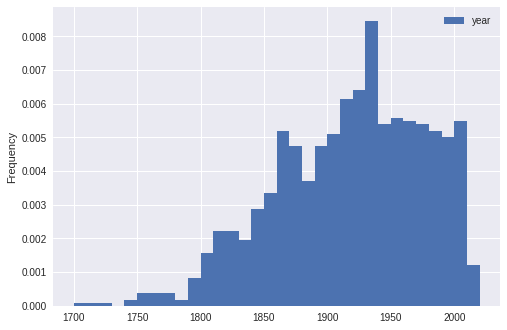

In [48]:
# make your plot here
seen.plot(kind='hist', y='year', bins=np.arange(1700, 2021, 10), density=True) # SOLUTION
prop_1950 = .0055 * 50 # SOLUTION
prop_1950

In [49]:
## TEST ##
0 <= prop_1950 <= 1

True

In [50]:
## HIDDEN TEST ##
.25 < prop_1950 < .29

True

**Question 2.** You will likely see that the number of meteorites seen falling grew substantially until it leveled off in the mid-1900s. Using your understanding of the universe, which one of the following is **not** a plausible partial explanation for why this may be?

1. The large increase in the number of meteorites being recorded is because of an actual increase in the number of meteorites hitting the Earth.
2. Population increases in remote areas have led to more people seeing meteorites that before would not have been witnessed.
3. Technological advancements have allowed humans to track and therefore see more meteorites as they approach Earth.
4. The recording of meteorite impacts is a recent phenomenon; in previous centuries, meteorites may have been observed but rarely recorded.

```
BEGIN QUESTION
name: q2_2
```

In [51]:
not_plausible = 1 # SOLUTION

In [52]:
## TEST ##
not_plausible in {1, 2, 3, 4}

True

In [53]:
## HIDDEN TEST ##
not_plausible

1

Next we might ask: Where are meteorites recorded? We can visualize the locations of impacts using a python package called `folium`. It has been installed for you. Let's import it now:

In [54]:
import folium

The code below shows how to create a map using `folium`. This map is centered at a latitude and longitude of (39, -98), which happens to be in Kansas.

In [55]:
m = folium.Map(location=[39.0, -98.0], zoom_start=4)
m

We can create markers on the map as shown below. Here we've made two markers: one for San Diego, and another for New York City.

In [56]:
folium.Marker(location=[32.7157, -117.1611]).add_to(m)
folium.Marker(location=[40.7, -74]).add_to(m)
m

Let's see if we can detect any patterns in the locations of meteorites. The function below takes in a dataframe of meteorites (like `df`) and uses `folium` to plot the location of each meteorite in the table.

In [57]:
def plot_meteorites(meteorite_df, center=(39.0, -0), zoom=2):
    m = folium.Map(location=center, min_zoom=2, zoom_start=zoom, max_bounds=True)
    for _, row in meteorite_df.get(['latitude', 'longitude', 'name'])._pd.iterrows():
        folium.CircleMarker(
            location=[row['latitude'], row['longitude']],
            popup=row['name'], radius=1.5
        ).add_to(m)
    display(m)

For example, here are 4000 randomly-chosen meteorites. Note that these meteorites include both those that have been found and those that have been observed falling. Note that you can pan, zoom, and click markers to see the name of each meteorite.

In [58]:
plot_meteorites(df.sample(4000))

We can also plot only those meteorites that have been observed while falling. Can you see a difference between the map below and the one above?

In [59]:
plot_meteorites(seen)

**Question 3**. By looking at the map above, which continent do you think has the most meteorites in the dataset overall? There's no wrong answer to this question -- it won't be graded for correctness.

1. Africa
1. Antarctica
1. Asia
1. Australia
1. Europe
1. North America
1. South America

*Note*: different educational systems have different definitions of "continent". For this question, we're using the 7-continent model -- but since it isn't graded, it doesn't really matter which model we use.

```
BEGIN QUESTION
name: q2_3
```

In [60]:
continent_guess = 1 # SOLUTION

In [61]:
## TEST ##
continent_guess in range(1, 8)

True

**Question 4.** Our table, `df`, includes the continent where each meteorite was recorded. Using table operations, construct a series named `per_continent` containing the number of meteorites recorded in each continent.

**Note**: for the purposes of this project, "recorded" means either found or observed while falling. In other words, use the whole table `df` for this question, not just those that were seen falling.

```
BEGIN QUESTION
name: q2_4
```

In [62]:
per_continent = df.groupby('continent').count().sort_values('name').get('name') # SOLUTION
per_continent

continent
South America      547
Europe             560
Australia          643
North America     1824
Asia              3647
Africa            9065
Antarctica       22099
Name: name, dtype: int64

In [63]:
## TEST ##
isinstance(per_continent, bpd.Series)

True

In [64]:
## TEST ##
len(per_continent)

7

In [65]:
## HIDDEN TEST ##
per_continent.get('Asia') == 3647

True

In [66]:
## HIDDEN TEST ##
per_continent.get('Antarctica') == 22099

True

In [67]:
## HIDDEN TEST ##
per_continent.sum() == 38385

True

**Question 5.** The answer to the last question may have surprised you -- let's investigate further. Some continents are much larger than others, and it is plausible that these continents have a larger number of meteorites simply by virtue of their size. To control for this, let's calculate the *number of meteorites per unit of area*.

The file `data/areas.csv` contains the area of each of the seven continents that appear in our data set. Construct a series named `density` containing the number of meteorites per square kilometer for each continent.

```
BEGIN QUESTION
name: q2_5
```

In [68]:
areas = bpd.read_csv('data/areas.csv').set_index('Continent') # SOLUTION NO PROMPT
density = per_continent / areas.get('Area (km^2)') # SOLUTION
density

Africa           0.000299
Antarctica       0.001556
Asia             0.000082
Australia        0.000084
Europe           0.000056
North America    0.000075
South America    0.000031
dtype: float64

In [69]:
## TEST ##
isinstance(density, bpd.Series)

True

In [70]:
## TEST ##
len(per_continent)

7

In [71]:
## HIDDEN TEST ##
np.isclose(density.get('Asia'), 8.1745e-5, rtol=.01)

True

In [72]:
## HIDDEN TEST ##
np.isclose(density.get('North America'), 7.5e-5, rtol=.01)

True

In [73]:
## HIDDEN TEST ##
np.isclose(density.sum(), .00218, rtol=.01)

True

If your answer is correct, the continent which has the most meteorites per unit area is also the one that has the most meteorites overall. This suggests that this continent really does have more recorded meteorites than other continents.

The key word in the previous sentence is *recorded*. Is it really the case that a certain part of the Earth *attracts* more meteorites than other parts? Probably not, but there is something going on here. Remember that meteorites are, by definition, meteors that survived the trip through the atmosphere long enough to hit the surface of the Earth. Therefore, it could be that certain regions of the planet have thinner atmospheres, making it more likely that a meteor survives entry. On the other hand, physics tells us that meteorite landings should be more-or-less randomly distributed across the surface of the Earth -- maybe the concentration of meteorites is due to something else? Let's see...

Perhaps visualizing the Antarctic meteorites again can give us a clue. The code below shows meteorites in the vicinity of McMurdo Sound, Antarctica.

In [74]:
plot_meteorites(df[df.get('continent') == 'Antarctica'].sample(4000), center=(-75, 170), zoom=5)

You should notice that the meteorites are clustered. Why is this? Is there something special about the regions these meteorites were found in?

Perhaps the name of the meteorite can give us a clue. Click a marker to see the meteorite's name, and repeat to learn about the different regions where meteorites were found. Search for some of these region names on Wikipedia to determine what the geology of the region is like.

*Hint*: you might learn a new word that starts with "m" -- this is related to the reason.

**Question 6**. In a few sentences, explain why meteorites are so commonly recorded in Antarctica. Does the data support the claim that meteorites are more likely to *fall* in Antarctica than elsewhere?

```
BEGIN QUESTION
name: q2_6
manual: true
```

**Solution**: Meteorites are commonly recorded in Antarctica because it is easier to *find* meteorites in Antarctica due to the action of glaciers and the fact that meteorites are easy to spot on ice. The data does not support the claim that more meteorites *fall* on Antarctica.

The hint refers to *moraine*, which is a collection of rocks deposited by a glacier.

**Question 7**. Now let's look at the various classifications of meteorites. These are stored in the *recclass* column. First, how many unique classifications are there? Don't hardcode your answer -- write code to compute it.

```
BEGIN QUESTION
name: q2_7
```

In [75]:
number_of_classes = df.get('recclass').unique().shape[0] # SOLUTION
number_of_classes

427

In [76]:
## TEST ##
import numbers
isinstance(number_of_classes, numbers.Integral)

True

In [77]:
## HIDDEN TEST ##
number_of_classes == 427

True

This is quite a lot! Next, let's understand how the classifications are distributed. Are there roughly the same number of meteorites in each class? Or are some classes more popular?

**Question 8**. What is the median number of meteorites in each class? What is the mean number of meteorites in each class?

```
BEGIN QUESTION
name: q2_8
```

In [78]:
class_counts = df.groupby('recclass').count() # SOLUTION NO PROMPT
median_in_each_class = class_counts.get('name').median() # SOLUTION
mean_in_each_class = class_counts.get('name').mean() # SOLUTION
median_in_each_class, mean_in_each_class

(3.0, 89.93208430913349)

In [79]:
## TEST ##
import numbers
isinstance(median_in_each_class, numbers.Real)

True

In [80]:
## TEST ##
import numbers
isinstance(mean_in_each_class, numbers.Real)

True

In [81]:
## HIDDEN TEST ##
np.isclose(median_in_each_class, 3, rtol=.01)

True

In [82]:
## HIDDEN TEST ##
np.isclose(mean_in_each_class, 89.9, rtol=.01)

True

**Question 9**. The mean and median are quite different. Which one of the explanations below could be the reason for this difference?

1. The median is much lower than the mean because of floating point error.
1. The mean is much lower than the median because it does not take outliers into account.
1. The mean is much higher than the median due to large outliers.
1. The mean is much higher than the median because of random chance.
1. The median is much smaller than the mean due to small outliers.

```
BEGIN QUESTION
name: q2_9
```

In [83]:
could_be_the_reason = 3 # SOLUTION

In [84]:
## TEST ##
could_be_the_reason in {1, 2, 3, 4}

True

In [85]:
## HIDDEN TEST ##
could_be_the_reason

3

**Question 10**. Considering only the classes which have more than 100 meteorites, plot a horizontal bar chart of the count of meteorites belonging to each class. Use your plot to answer the question: which class has the fifth most meteorites? Your answer should be in the form of a string.

```
BEGIN QUESTION
name: q2_10
```

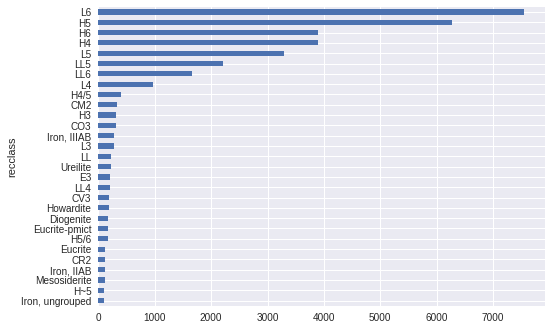

In [86]:
# make your plot here
class_counts[class_counts.get('name') > 100].get('name').sort_values().plot(kind='barh') # SOLUTION
fifth_most = 'L5' # SOLUTION

In [87]:
## TEST ##
isinstance(fifth_most, str)

True

In [88]:
## TEST ##
fifth_most.lower()

'l5'

Lastly, let's look at the mass of the meteorites. Here's a simple histogram of the masses:

<AxesSubplot:ylabel='Frequency'>

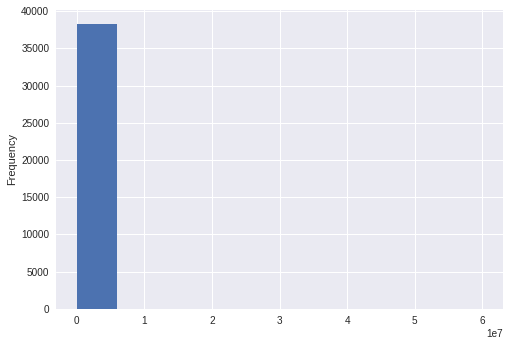

In [89]:
df.get('mass (g)').plot(kind='hist')

Well, that's unhelpful. We are seeing this because the largest meteorites are much larger than the smallest, but they are relatively infrequent.

In [90]:
df.get('mass (g)').max()

60000000.0

In [91]:
df.get('mass (g)').min()

0.0

Apparently some meteorites are given a mass of 0. This could be because the meteorites are very light, or because the weight was unknown and a placeholder of 0 was used. The massive 60 million gram meteorite is [Hoba](https://en.wikipedia.org/wiki/Hoba_meteorite), a meteorite which fell on present-day Namibia some time within the last 80,000 years.

There are ways to improve the visualization. First, we can plot a histogram of a subset of the data; for instance, from 0 to 500 grams:

<AxesSubplot:ylabel='Frequency'>

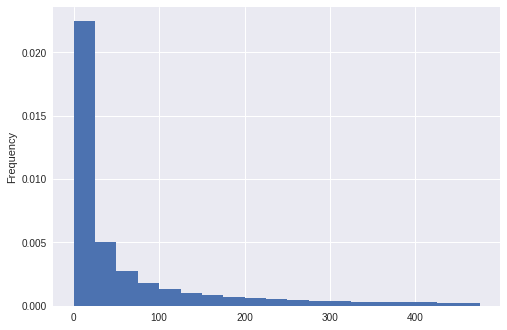

In [92]:
df.get('mass (g)').plot(kind='hist', bins=np.arange(0, 500, 25), density=True)

We can also use the `logy = True` argument to `.plot()` to plot the y-axis on a logarithmic scale:

<AxesSubplot:ylabel='Frequency'>

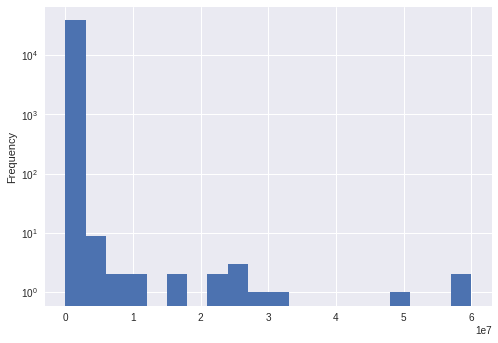

In [93]:
df.get('mass (g)').plot(kind='hist', logy=True, bins=20)

Note that we have omitted the `density = True` keyword argument, so this is a histogram of *counts*. 

**Question 11**. Let's see if there is any trend in the average mass of meteorites over time. As with the first part of this section, we will restrict ourselves to only those meteorites that are observed while falling (that is, meteorites for which *is_found* is `False`).

Draw a bar chart of the median mass of meteorites seen in each decade between 1900 and now. Use your bar chart to answer the question: What was the median mass of meteorites that were seen in the 1990s?

```
BEGIN QUESTION
name: q2_11
```

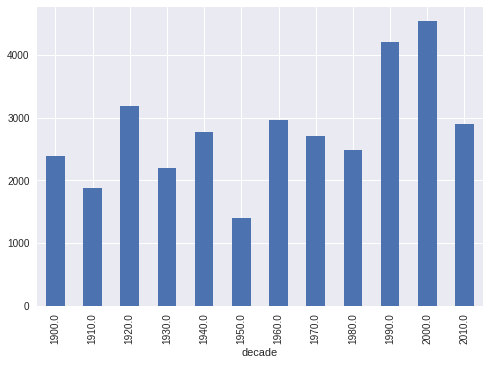

In [94]:
# make your plot here
seen[seen.get('year') > 1900].groupby('decade').median().get('mass (g)').plot(kind='bar') # SOLUTION
observed_falling_in_90s = 4200 # SOLUTION

In [95]:
## TEST ##
import numbers
isinstance(observed_falling_in_90s, numbers.Real)

True

In [96]:
## HIDDEN TEST ##
4100 < observed_falling_in_90s < 4500

True

It looks like some decades have heavier meteorites than others. In the next section, we'll investigate this to see if it is a real phenomenon, or whether it might be due to chance.

Before we move on, let's look at the closest meteorites to San Diego, just for fun:

In [97]:
coords = np.column_stack([
    df.get('latitude'),
    df.get('longitude')
])

distances = np.sum((coords - np.array([32.7, -117.1]))**2, axis=1)

closest = df.iloc[np.argsort(distances)[:10]]

plot_meteorites(closest, center=(32.7, -117.1), zoom=8)

---

## Part 3: Statistics

**Lectures to review: 08-Simulation; 09-Sampling; 10-Models, Statistics; 11-Hypothesis Testing; 12-AB Testing; 13-Bootstrap; 14-CI; 15-CLT; 16-Normal CI**

In this section we will take a deeper look at some of the trends uncovered in our EDA in order to determine if they are real phenomena, or just due to chance.

In Part 2, Question 11, we plotted the median mass of meteorites per decade. We saw that some decades had much heavier medians than others. Is this a real phenomenon? Or is it possible that this is simply due to chance? We can answer this with a hypothesis test.

Our intuition tells us that a meteorite's mass is essentially random. That is, when Nature decides to throw a meteorite at the Earth, it doesn't first check the date. Of course, there may be reasons for heavier meteorites to cluster together in time -- for instance, maybe a large meteor breaks into several pieces, all of which fall around the same time. However, we might believe these events to be sufficiently rare so as to not affect the decadal medians.

Given this intuition, we'll introduce the following null and alternative hypotheses:

**Null Hypothesis**: Nature assigns meteorite masses randomly, with no relationship to the decade that the meteorite was observed.

**Alternative Hypothesis**: The median meteorite mass is significantly higher in some decades as compared to others.

**Question 1a**. Which of the examples seen in lecture had the most similar null/alternative hypothesis to the current situation? (*Hint*: relating a problem to one seen in lecture is a great way to choose the right statistical test to apply).

1. Is the coin fair? (Lecture 10)
1. The Swain jury panel (Lecture 10)
1. The Alameda county jury panels (Lecture 11)
1. Is the TA a poor teacher? (Lecture 11)
1. Deflategate (Lecture 12)
1. Smoking and Baby Weight (Lecture 12)

```
BEGIN QUESTION
name: q3_1a
```

In [98]:
most_similar_3_1a = 4 # SOLUTION

In [99]:
## TEST ##
most_similar_3_1a in range(1, 7)

True

In [100]:
## HIDDEN TEST ##
most_similar_3_1a

4

**Question 1b**. Which of the below test statistics would be the most reasonable choice for this situation?

1. The maximum of any decadal median.
2. The minimum of any decadal median.
3. The difference between the maximum decadal median and the median decadal median.
4. The average decadal median.
5. The median mass in the 1990s.

```
BEGIN QUESTION
name: q3_1b
```

In [101]:
test_stat_guess_3_1b = 3 # SOLUTION

In [102]:
## TEST ##
test_stat_guess_3_1b == 3

True

Our test statistic should tell us something about the difference in median mass between decades. While there are several choices, we will use the *difference between the maximum decadal median and the minimum decadal median* (fix your answer above if you guessed something else!). That is, we'll find the decade with the largest median mass and the decade with the smallest, and subtract these two medians. The result will be a non-negative number. If this number is large, it means that there is a pair of decades with a very big difference in median meteorite mass. Under the null hypothesis, this difference should be relatively small.

**Question 2**. Before computing our test statistic, it will be useful to restrict our data set to only those meteorites that are *seen* (i.e., the ones that were *not* found), and which fell on or after the year 1900. Create a dataframe named `seen_since_1900` which contains only these meteorites.

```
BEGIN QUESTION
name: q3_2
```

In [103]:
seen_since_1900 = df[(df.get('year') >= 1900) & (~df.get('is_found'))] # SOLUTION
seen_since_1900

,name,recclass,mass (g),year,latitude,longitude,decade,is_valid,is_found,continent
id,,,,,,,,,,
2,Aarhus,H6,720.0,1951.0,56.18333,10.23333,1950.0,True,False,Europe
6,Abee,EH4,107000.0,1952.0,54.21667,-113.00000,1950.0,True,False,North America
10,Acapulco,Acapulcoite,1914.0,1976.0,16.88333,-99.90000,1970.0,True,False,North America
370,Achiras,L6,780.0,1902.0,-33.16667,-64.95000,1900.0,True,False,South America
379,Adhi Kot,EH4,4239.0,1919.0,32.10000,71.80000,1910.0,True,False,Asia
...,...,...,...,...,...,...,...,...,...,...
30399,Zemaitkiemis,L6,44100.0,1933.0,55.30000,25.00000,1930.0,True,False,Europe
30404,Zhaodong,L4,42000.0,1984.0,45.81667,125.91667,1980.0,True,False,Asia
30407,Zhovtnevyi,H6,107000.0,1938.0,47.58333,37.25000,1930.0,True,False,Europe


In [104]:
## TEST ##
seen_since_1900.shape[0]

698

**Question 3**. Define a function named `mass_range` which accepts one argument, a dataframe (of the form of `df`, `seen_since_1900`, or similar), and returns the value of the test statistic for the meteorites in that dataframe.

```
BEGIN QUESTION
name: q3_3
```

In [105]:
def mass_range(meteorites):
    medians = meteorites.groupby('decade').median().get('mass (g)') # SOLUTION NO PROMPT
    return medians.max() - medians.min() # SOLUTION

In [106]:
## TEST ##
callable(mass_range)

True

In [107]:
## TEST ##
import numbers
isinstance(mass_range(df), numbers.Real)

True

In [108]:
## HIDDEN TEST ##
np.isclose(mass_range(df), 49999989, rtol=.001)

True

In [109]:
## HIDDEN TEST ##
np.isclose(mass_range(seen_since_1900), 3134.5, rtol=.001)

True

**Question 4**. Under the null hypothesis, the values in the *decade* column are not related to the values in the *mass (g)* column. As a result, we can simulate a new dataset under the null hypothesis by permuting the *decade* column. We can then generate a new test statistic using this simulated data.

Generate 1000 values of the test statistic using the above approach and place them in a numpy array called `test_stats`.

*Hint*: you may create additional cells if you'd like. Your code should take at most a few minutes to run; if it takes too long, it may not receive credit.

```
BEGIN QUESTION
name: q3_4
```

In [110]:
# BEGIN SOLUTION NO PROMPT
def mass_experiment():
    shuffled = seen_since_1900.assign(decade=np.random.permutation(seen_since_1900.get('decade')))
    return mass_range(shuffled)

test_stats = []
for i in range(1000):
    test_statistic = mass_experiment()
    test_stats.append(test_statistic)
# END SOLUTION
test_stats = np.array(test_stats) # SOLUTION

In [111]:
## TEST ##
isinstance(test_stats, np.ndarray)

True

In [112]:
## TEST ##
len(test_stats)

1000

In [113]:
## HIDDEN TEST ##
3200 < np.mean(test_stats) < 3800

True

**Question 5.** Compute the p-value of the observed test statistic.

```
BEGIN QUESTION
name: q3_5
```

In [114]:
observed = mass_range(seen_since_1900) # SOLUTION NO PROMPT
p_value = np.count_nonzero(np.array(test_stats) > observed) / len(test_stats) # SOLUTION
p_value

0.469

In [115]:
## TEST ##
import numbers
isinstance(p_value, numbers.Real)

True

In [116]:
## HIDDEN TEST ##
observed = mass_range(seen_since_1900)
correct_p_value = np.count_nonzero(np.array(test_stats) > observed) / len(test_stats)
np.isclose(p_value, correct_p_value, rtol=.03)

True

**Question 6.** Which one of the following conclusions can we make given the result of the test?

1. The null hypothesis is true
1. We should reject the null hypothesis (assuming we use a 5% threshold for significance)
1. The results of the test are consistent with the null hypothesis that the meteorite masses do not depend on the decade

```
BEGIN QUESTION
name: q3_6
```

In [117]:
conclusion = 3 # SOLUTION

In [118]:
## TEST ##
conclusion in range(1, 4)

True

In [119]:
## HIDDEN TEST ##
conclusion

3

In the EDA section above, we saw that there was a difference in where meteorites were *found* and where they are *seen*. As a reminder, here is the plot of locations of *seen* meteorites:

In [120]:
seen = df[~df.get('is_found')]
plot_meteorites(seen)

A likely explanation for this is that a meteorite is more likely to be seen if it falls near a populated area. In fact, compare the above map with this composite image of the Earth at night -- the nighttime lights show areas that are densely populated:

<img src="./data/lights.jpg">

We might suppose that the number of meteorites spotted in a continent is proportional to the *population* of the continent, but this is not quite right. Consider, for instance, Asia, which has the greatest population out of any of the continents, by far. This population, however, is not spread evenly over the surface of the continent -- it is concentrated in several areas. We can see this in the nighttime image above -- large parts of Asia are relatively sparsely inhabited.

Instead, we might suppose that the number of meteorites seen in a continent is proportional to the total area of the continent that is "populated". One way to do this is to count (for each continent) the number of pixels in the above image which are brighter than some threshold. The more bright pixels, the more land area that is populated, and the more surface area where a falling meteorite is likely to be seen.

We have done this work for you. We broke the surface of the Earth up into 259200 rectangular cells and counted the number of cells that are populated for each continent. The results are contained in `data/populated_cells.csv`.

In [121]:
populated_cells = bpd.read_csv('./data/populated_cells.csv').set_index('Continent')
populated_cells

,Cells
Continent,
Asia,10092
Africa,5558
Europe,4608
North America,3181
South America,2645
Australia,176


**Question 7.** Assume that a given meteorite will land in one of the six continents listed above, and that the probability that the meteorite is seen in a given continent is proportional to the number of populated cells in that continent. Calculate a series containing the probability of the meteorite being seen in each continent.

```
BEGIN QUESTION
name: q3_7
```

In [122]:
probabilities = populated_cells.get('Cells') / populated_cells.get('Cells').sum() # SOLUTION
probabilities

Continent
Asia             0.384311
Africa           0.211653
Europe           0.175476
North America    0.121135
South America    0.100724
Australia        0.006702
Name: Cells, dtype: float64

In [123]:
## TEST ##
isinstance(probabilities, bpd.Series)

True

In [124]:
## TEST ##
len(probabilities)

6

In [125]:
## HIDDEN TEST ##
np.isclose(probabilities.loc['Asia'], .3843, rtol=.01)

True

**Question 8**. Restricting yourself to only those meteorites which were *seen* falling after 1980, calculate the proportion of meteorites which fell in each continent. Save your answer in a series named `proportions`.

```
BEGIN QUESTION
name: q3_8
```

In [126]:
counts = seen[seen.get('year') > 1980].groupby('continent').count() # SOLUTION NO PROMPT
proportions = counts.get('name') / counts.get('name').sum() # SOLUTION
proportions

continent
Africa           0.255682
Asia             0.369318
Australia        0.017045
Europe           0.125000
North America    0.181818
South America    0.051136
Name: name, dtype: float64

In [127]:
## TEST ##
isinstance(proportions, bpd.Series)

True

In [128]:
## TEST ##
len(proportions)

6

In [129]:
## HIDDEN TEST ##
np.isclose(proportions.loc['Asia'], 0.369318, rtol=.01) or (np.isclose(proportions.loc['Asia'], 0.384615, rtol=.01))

True

Consider the null and alternative hypotheses shown below:

**Null Hypothesis**: The locations of meteorites seen since 1980 were generated by the distribution in the `probabilities` series.

**Alternative Hypothesis**: The locations were generated from some other distribution.

**Question 9a**. Which of the examples seen in lecture had the most similar null/alternative hypothesis to the current situation?

1. Is the coin fair? (Lecture 10)
1. The Swain jury panel (Lecture 10)
1. The Alameda county jury panels (Lecture 11)
1. Is the TA a poor teacher? (Lecture 11)
1. Deflategate (Lecture 12)
1. Smoking and Baby Weight (Lecture 12)

```
BEGIN QUESTION
name: q3_9a
```

In [130]:
most_similar_3_9a = 3 # SOLUTION

In [131]:
## TEST ##
most_similar_3_9a in range(1, 7)

True

In [132]:
## HIDDEN TEST ##
most_similar_3_9a

3

**Question 9b**. Using your answer for the previous part of this question as your guide, which of the below test statistics would be the most reasonable choice for this situation?

1. The proportion of meteorites seen in Asia.
2. The proportion of meteorites that are not seen in Asia.
3. The difference between the proportion of meteorites seen in Asia and the probability that a meteorite falls in Asia (according to `probabilities`)
4. The TVD between the proportion of meteorites falling in each continent and the probabilities in `probabilities`.
5. The difference between the maximum proportion falling in any continent and the maximum probability in `probabilities`.

```
BEGIN QUESTION
name: q3_9b
```

In [133]:
test_stat_guess_3_9b = 4 # SOLUTION

In [134]:
## TEST ##
test_stat_guess_3_9b == 4

True

**Question 10.** Write a function named `generate_proportions` which accepts no arguments and which simulates the location of 176 meteorite landings according to the distribution in `probabilities` (176 because 176 meteorites have been seen since 1980). The return value of your function should be a numpy array of size 7 which contains the proportion of simulated meteorite landings in each of the 7 continents (in the order that they appear in `probabilities`).

```
BEGIN QUESTION
name: q3_10
```

In [135]:
def generate_proportions():
    return np.random.multinomial(176, probabilities) / 176 # SOLUTION

In [136]:
## TEST ##
callable(generate_proportions)

True

In [137]:
## TEST ##
isinstance(generate_proportions(), np.ndarray)

True

In [138]:
## TEST ##
len(generate_proportions())

6

In [139]:
## HIDDEN TEST ##
np.isclose(generate_proportions().sum(), 1, rtol=.001)

True

In [140]:
## HIDDEN TEST ##
mu = sum([generate_proportions()[0] for _ in range(1000)]) / 1000
.37 < mu < .395

True

**Question 11**. Using your function `generate_proportions` to simulate landings and the Total Variation Distance (TVD) as your test statistic, generate 1000 values of the test statistic. Place them in an array named `tvd_stats`

*Hint*: you may create additional cells if you'd like. Your code should take at most a few minutes to run; if it takes too long, it may not receive credit.

```
BEGIN QUESTION
name: q3_11
```

In [141]:
# BEGIN SOLUTION NO PROMPT
def tvd(x, y):
    return np.abs(x - y).sum() / 2

tvd_stats = []
for i in range(1000):
    simulated = generate_proportions()
    d = tvd(simulated, probabilities)
    tvd_stats.append(d)
# END SOLUTION
tvd_stats = np.array(tvd_stats) # SOLUTION

In [142]:
## TEST ##
isinstance(tvd_stats, np.ndarray)

True

In [143]:
## TEST ##
len(tvd_stats)

1000

In [144]:
## HIDDEN TEST ##
.055 < np.mean(tvd_stats) < .065

True

**Question 12**. Calculate the probability under the null hypothesis of observing a TVD that is at least as extreme as that observed in actuality.

```
BEGIN QUESTION
name: q3_12
```

In [145]:
observed = tvd(proportions, probabilities) # SOLUTION NO PROMPT
tvd_p_value = np.count_nonzero(tvd_stats > observed) / 1000 # SOLUTION
tvd_p_value

0.019

In [146]:
## TEST ##
0 <= tvd_p_value <= 1

True

In [147]:
## HIDDEN TEST ##
tvd_p_value < .025

True

**Question 13**. What can we conclude from the result of this hypothesis test?

1. We reject the null hypothesis that the meteorites seen since 1980 were generated from the distribution in `probabilities`.
2. We accept the null hypothesis.
3. The null hypothesis is consistent with what was observed.

```
BEGIN QUESTION
name: q3_13
```

In [148]:
prob_conclusion = 1 # SOLUTION

In [149]:
## TEST ##
prob_conclusion in range(1, 4)

True

In [150]:
## HIDDEN TEST ##
prob_conclusion

1

A potentially interested observation is that the meteorites that have been seen in Asia since data has been recorded are, on the median, more massive than meteorites that have landed in North America:

In [151]:
seen[seen.get('continent') == 'Asia'].get('mass (g)').median()

2600.0

In [152]:
seen[seen.get('continent') == 'North America'].get('mass (g)').median()

2111.87

Is this a real difference? Or is it just due to chance?

**Question 14**. We will run a hypothesis test to answer this question. Which of the examples seen in lecture is most similar to the current situation?

1. Is the coin fair? (Lecture 10)
1. The Swain jury panel (Lecture 10)
1. The Alameda county jury panels (Lecture 11)
1. Is the TA a poor teacher? (Lecture 11)
1. Deflategate (Lecture 12)
1. Smoking and Baby Weight (Lecture 12)

```
BEGIN QUESTION
name: q3_14
```

In [153]:
most_similar_3_14 = 6 # SOLUTION

In [154]:
## TEST ##
most_similar_3_14 in range(1, 7)

True

In [155]:
## HIDDEN TEST ##
most_similar_3_14

6

**Question 15**. Using the table `seen` as a starting point, run a permutation test for the null hypothesis that the mass of meteorites seen in Asia and that of those seen in North America come from the same distribution. The alternative hypothesis is that that mass of meteorites seen in Asia is larger. As a test statistic, use the (signed) difference in medians between the two groups. Use 1000 permutations in your test. For your answer, report the p-value.

*Hint*: think carefully about what data should be included. Should we shuffle all of the rows of `seen`, or work only with data from NA/Asia?

*Hint 2*: you may create additional cells if you'd like. Your code should take at most a few minutes to run; if it takes too long, it may not receive credit.

```
BEGIN QUESTION
name: q3_15
```

In [156]:
# BEGIN SOLUTION NO PROMPT
subset = seen[(seen.get('continent') == 'Asia') | (seen.get('continent') == 'North America')].get(['mass (g)', 'continent'])

def difference_in_medians(df):
    medians = df.groupby('continent').median().get('mass (g)')
    return medians.loc['Asia'] - medians.loc['North America']

stats = []
for i in range(1000):
    shuffled = subset.assign(continent=np.random.permutation(subset.get('continent')))
    stats.append(difference_in_medians(shuffled))
    
stats = np.array(stats)
observed = difference_in_medians(subset)
# END SOLUTION
perm_p_value = np.count_nonzero(stats > observed) / len(stats) # SOLUTION
perm_p_value

0.23

In [157]:
## TEST ##
0 <= perm_p_value <= 1

True

In [158]:
## HIDDEN TEST ##
.15 < perm_p_value < .3

True

**Question 16**. Using data in the `seen` table, construct bootstrapped 95% confidence intervals for both:

1. the median mass of meteorites *seen falling* in North American
2. the median mass of meteorites *seen falling* in Asia

Use 2000 bootstrap samples to construct your confidence intervals.

Your confidence intervals should be lists with two entries: the lower bound and the upper bound of the interval.

*Hint*: you can use your answer for this question as a check on Question 15. They should agree.

*Hint 2*: you may create additional cells if you'd like. Your code should take at most a few minutes to run; if it takes too long, it may not receive credit.

```
BEGIN QUESTION
name: q3_16
```

In [159]:
# BEGIN SOLUTION NO PROMPT
def bootstrap_medians(continent):
    subset = seen[seen.get('continent') == continent]
    
    medians = []
    for i in range(2000):
        sample = subset.sample(subset.shape[0], replace=True)
        median = sample.get('mass (g)').median()
        medians.append(median)
        
    return np.array(medians)
# END SOLUTION
na_medians = bootstrap_medians('North America') # SOLUTION NO PROMPT
asia_medians = bootstrap_medians('Asia') # SOLUTION NO PROMPT
asia_ci = np.percentile(asia_medians, 2.5), np.percentile(asia_medians, 97.5) # SOLUTION
na_ci = np.percentile(na_medians, 2.5), np.percentile(na_medians, 97.5) # SOLUTION

In [160]:
## TEST ##
len(asia_ci)

2

In [161]:
## TEST ##
len(na_ci)

2

In [162]:
## HIDDEN TEST ##
1600 < asia_ci[0] < 2000

True

In [163]:
# HIDDEN TEST ##
3300 < asia_ci[1] < 3700

True

In [164]:
## HIDDEN TEST ##
1300 < na_ci[0] < 1700

True

In [165]:
## HIDDEN TEST ##
3250 < na_ci[1] < 3650

True

**Question 16**. The table `seen` is not a list of *all* meteorites that fell in recent history; obviously, there were many meteorites that fell but were not seen. In this sense, `seen` is a sample of all meteorites that fell in recent history. Out of these meteorites, roughly 25% are over 10,000 grams in mass, as the cell below shows:

In [166]:
large_prop = seen[seen.get('mass (g)') > 10_000].shape[0] / seen.shape[0]
large_prop

0.2497721057429353

Using the Central Limit Theorem, construct a 95% confidence interval for the population proportion of meteorites which are above 10,000 grams. Your answer should be a list of two numbers: the lower and upper bounds of the confidence interval.

```
BEGIN QUESTION
name: q3_16
```

In [167]:
# BEGIN SOLUTION NO PROMPT
is_large = seen.get('mass (g)') > 10_000
sigma = np.std(is_large)
delta = sigma / np.sqrt(len(is_large))
# END SOLUTION
normal_ci = [large_prop - 2*delta, large_prop + 2*delta] # SOLUTION
normal_ci

[0.22363272748940677, 0.27591148399646381]

In [168]:
## TEST ##
len(normal_ci)

2

In [169]:
## HIDDEN TEST ##
np.isclose(normal_ci[0], .223, rtol=.01)

True

In [170]:
## HIDDEN TEST ##
np.isclose(normal_ci[1], .275, rtol=.01)

True

**Question 17**. In the last question, we said that `seen` is a sample of the population of meteorites that have fallen in recent years and used this to construct a confidence interval. In order for this confidence interval to be accurate, `seen` should be a *random sample* of meteorites.

Do you believe `seen` is a random sample, or might it be biased? Why or why not?

```
BEGIN QUESTION
name: q3_17
manual: true
```

**Solution**: It is likely not a random sample. This is because meteorites must be large to be seen by eye. Therefore, `seen` is biased towards large meteorites, and there are potentially many small meteorites that were not seen.

# Finish Line

Congratulations! You've completed Project 02. To submit your assignment:

1. Select `Kernel -> Restart & Run All` to ensure that you have executed all cells, including the test cells. <p style="color: red"><b>Important!</b> We will allot 20 minutes of computer time to run your notebook. If your notebook takes longer than this to run, it may not pass the autograder! Run "Kernel -> Restart and Run All" to time how long your notebook takes. A notebook with correct answers should take less than 5 minutes.</p>
2. Read through the notebook to make sure everything is fine and all tests passed.
3. Run the cell below to run all tests, and make sure that they all pass.
4. Download your notebook using `File -> Download as -> Notebook (.ipynb)`, then upload your notebook to Gradescope.

In [171]:
grader.check_all()